© [Mariia Seleznova](https://www.ai.math.uni-muenchen.de/members/phd_students/seleznova/index.html) 2022

https://github.com/mselezniova/MSML22

Distributed under the [Creative Commons Attribution License](https://creativecommons.org/licenses/by/4.0/)

# Visualization and Data Processing

## Visualization with Matplotlib

Python `matplotlib` package offers a wide variety of methods for data visualization. We will look at a few examples today.  

You can also have a look at the [Matplotlib gallery](https://matplotlib.org/gallery/index.html) with various code examples, which you can adapt for your use case. 

In Jupyter it is possible to display graphs right in the notebook with the following magic command:

In [1]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


We can also configure Matplotlib to use a vector instead of a bitmap format to render the plots:

In [2]:
%config InlineBackend.figure_format='svg'

`matplotlib` is well-integrated with `numpy`:

In [3]:
import numpy as np

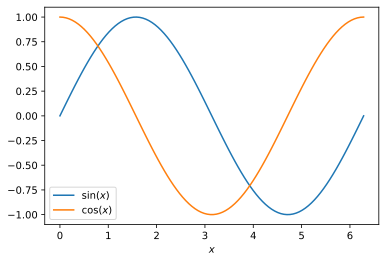

In [4]:
x = np.linspace(0, 2*np.pi, 100)

plt.plot(x, np.sin(x), label='$\sin(x)$')
plt.plot(x, np.cos(x), label='$\cos(x)$')
plt.xlabel('$x$')
plt.legend()

Although the arguments in the `plot()` look similar to the way we would maybe define the functions, e.g., $x\to\sin(x)$, keep in mind however that `x` is a Numpy array keeping an equally spaced grid of 100 float point numbers between 0 and $2\pi$ and `np.sin(x)` is again a Numpy array obtained by applying the $\sin$ function to each of elements of `x` separately.

Matplotlib's graph is a `Figure` object that can feature multiple `Axes` (corresponding to subplots). 

There are two paradigms to control the hierarchy of plots in a figure:

* A state machine keeping track of the currently active figure and axis (we have used this way above);
* Direct way of sending commands to secified axes (which we use below).

In [5]:
?plt.subplots

Text(0, 0.5, '$\\cos(x)$')

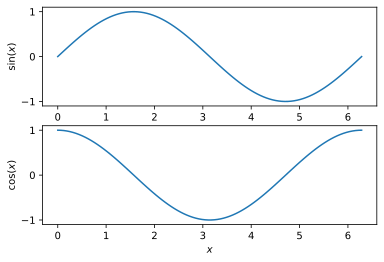

In [6]:
fig, axs = plt.subplots(2, 1)

axs[0].plot(x, np.sin(x))
axs[0].set_xlabel('$x$')       #note: plt.xlabel() but ax.set_xlabel()
axs[0].set_ylabel('$\sin(x)$')

axs[1].plot(x, np.cos(x))
axs[1].set_xlabel('$x$')
axs[1].set_ylabel('$\cos(x)$')

Text(0, 0.5, '$\\cos(x)$')

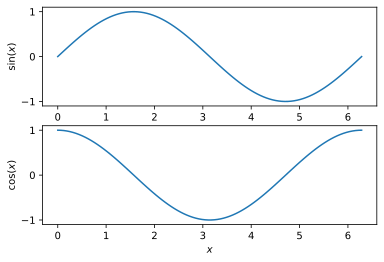

In [7]:
fig, axs = plt.subplots(2, 1)

plt.axes(axs[0]) # changes th current axis to axs[0]
plt.plot(x, np.sin(x))
plt.xlabel('$x$')       # note: plt.xlabel() but ax.set_xlabel()
plt.ylabel('$\sin(x)$')

plt.axes(axs[1])
plt.plot(x, np.cos(x))
plt.xlabel('$x$')
plt.ylabel('$\cos(x)$')

Plots can be nicely stacked:

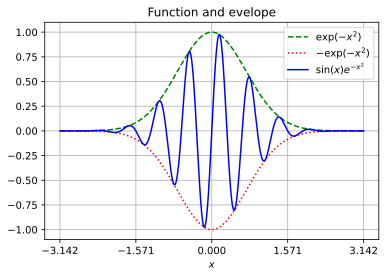

In [8]:
fig, ax = plt.subplots()

x = np.linspace(-np.pi, np.pi, 1000)
y = np.sin(10*x)
envelope = np.exp(-x**2)

ax.set_title('Function and evelope')
ax.set_xticks(np.linspace(-np.pi, np.pi, 5))
ax.grid()
ax.plot(x, envelope, color='green', ls='--', label='$\exp(-x^2)$')
ax.plot(x, -envelope, color='red', ls=':', label='$-\exp(-x^2)$')
ax.plot(x, y*envelope, color='blue', label='$\sin(x)e^{-x^2}$')
ax.set_xlabel('$x$')
ax.legend()

There are many supported plot types, for example, scatter, bar, and contourplots:

In [9]:
fig, axs = plt.subplots(1, 3, figsize=(10,3), gridspec_kw={'width_ratios': [1, 1, 1.3]})

r1 = np.random.randn(100, 100)*3 
r2 = np.random.randn(100, 100)

axs[0].grid()
axs[0].scatter(r1[0,:], r1[:,0], color='red')
axs[0].scatter(r2[0,:], r2[:,0], color='blue')

h = np.random.randn(100)
axs[1].bar(np.arange(len(h)), h)

x = np.linspace(-5, 5, 1000).reshape(1, 1000)
y = np.linspace(-5, 5, 1000).reshape(1000, 1)
cp = axs[2].contourf(np.sin(x * y) * np.cos(x**2 + y**2))
fig.colorbar(cp)

Also 3d plots:

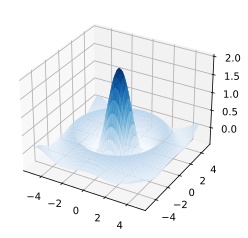

In [10]:
from matplotlib import cm

fig, ax = plt.subplots(subplot_kw={'projection': '3d'})

X = np.arange(-5, 5, 0.1)
Y = np.arange(-5, 5, 0.1)
X, Y = np.meshgrid(X, Y)
R = np.sqrt(X**2 + Y**2)
Z = np.sin(2*R) / R

surf = ax.plot_surface(X, Y, Z, cmap=cm.Blues)

## Handle data with Pandas

The `pandas` package offers a variety of methods to load and pre-process data. Its basic objects are `Series` and `DataFrames` that have similarilies to arrays but much more functionality.

In [11]:
import pandas as pd

Serieses are very similar to lists, however, among many further functions, we can assign it a non-integer index, including boolean expressions.

In [12]:
s = pd.Series([1, 2, 3])
print(s)

0    1
1    2
2    3
dtype: int64


In [13]:
print(s[1])

2


In [14]:
s.index = ['eins', 'zwei', 'drei']
print(s)

eins    1
zwei    2
drei    3
dtype: int64


In [15]:
print(s['zwei'])

2


Pandas allows indexing by an array:

In [16]:
print(s[['zwei', 'eins']])

zwei    2
eins    1
dtype: int64


And easy filtering:

In [17]:
print(s[s>1])

zwei    2
drei    3
dtype: int64


Concating two series along an axis gives a `DataFrame`, which has similarly powerful indexing functionality:

In [18]:
s1 = pd.Series(np.random.randn(3), index=['A', 'B', 'C'], name='s1')
s2 = pd.Series(np.random.randn(3), index=['A', 'B', 'C'], name='s2')
df = pd.concat([s1, s2], axis=1)

print(s1, end='\n\n')
print(s2, end='\n\n')

df

A    1.469441
B   -2.148733
C    0.172570
Name: s1, dtype: float64

A   -0.978508
B    0.009535
C    0.864302
Name: s2, dtype: float64



,s1,s2
A,1.469441,-0.978508
B,-2.148733,0.009535
C,0.172570,0.864302


In [19]:
df.index

Index(['A', 'B', 'C'], dtype='object')

In [20]:
df.values

array([[ 1.46944134, -0.97850826],
       [-2.14873324,  0.00953517],
       [ 0.17257032,  0.86430203]])

There are many statistics functions build-in:

In [21]:
df.describe()

,s1,s2
count,3.000000,3.000000
mean,-0.168907,-0.034890
std,1.833099,0.922208
min,-2.148733,-0.978508
25%,-0.988081,-0.484487
50%,0.172570,0.009535
75%,0.821006,0.436919
max,1.469441,0.864302


Indexing: 

In [22]:
df['s1']

A    1.469441
B   -2.148733
C    0.172570
Name: s1, dtype: float64

In [23]:
df[['s1','s1']]

,s1,s1
A,1.469441,1.469441
B,-2.148733,-2.148733
C,0.172570,0.172570


In [24]:
df.loc['A']

s1    1.469441
s2   -0.978508
Name: A, dtype: float64

In [25]:
df.loc['A':'B']

,s1,s2
A,1.469441,-0.978508
B,-2.148733,0.009535


In [26]:
df.loc['A':'B','s1':'s2']

,s1,s2
A,1.469441,-0.978508
B,-2.148733,0.009535


In [27]:
df.iloc[1:3]

,s1,s2
B,-2.148733,0.009535
C,0.172570,0.864302


In [28]:
df.iloc[1:3,1:]

,s2
B,0.009535
C,0.864302


It is also easy to filter dataframes:

In [29]:
df[df['s2']>1.]

,s1,s2


Apply a function to a dataframe:

In [30]:
df.apply(lambda x: x*2)

,s1,s2
A,2.938883,-1.957017
B,-4.297466,0.019070
C,0.345141,1.728604


Another useful function is groupby:

In [31]:
df['s3']=['a','a','b']

In [32]:
df

,s1,s2,s3
A,1.469441,-0.978508,a
B,-2.148733,0.009535,a
C,0.172570,0.864302,b


In [33]:
df.groupby(by='s3')

In [34]:
df.groupby(by='s3').mean()

,s1,s2
s3,,
a,-0.339646,-0.484487
b,0.172570,0.864302


## Example: Greenhouse gas concentration 

Let us obtain the global CO2 concentration data base from the [Greenhouse Gas Factsheets page](https://greenhousegases.science.unimelb.edu.au) provided by the University of Melbourne. Note that we download the data directly from the web using the provided url.

So to watch our carbon footprint we will save the data to a file and afterwards only load the data from this local file.

In [35]:
import os

file_name = 'global_co2_database.csv'
url = 'https://greenhousegases.science.unimelb.edu.au/data/historical/CMIP6GHGConcentrationHistorical_1_2_0/mole-fraction-of-carbon-dioxide-in-air_input4MIPs_GHGConcentrations_CMIP_UoM-CMIP-1-2-0_gr1-GMNHSH_000001-201412.csv'

if os.path.exists(file_name):
    print('Loading data from local file...')
    df = pd.read_csv(file_name)
else:
    print('Loading data ...')
    df = pd.read_csv(url)
    df.to_csv(file_name)
print('Done.')

Loading data from local file...
Done.


Let us inspect the data:

In [36]:
df

,Unnamed: 0,datenum,year,month,day,datetime,data_mean_global,data_mean_nh,data_mean_sh
0,0,15.5,0,1,15,15-Jan-0000 12:00:00,278.366425,279.045654,277.687225
1,1,45.5,0,2,14,14-Feb-0000 12:00:00,278.713043,279.665405,277.760712
2,2,75.5,0,3,15,15-Mar-0000 12:00:00,279.013824,280.266785,277.760895
3,3,106.0,0,4,15,15-Apr-0000 00:00:00,279.209625,280.756592,277.662628
4,4,136.5,0,5,15,15-May-0000 12:00:00,279.106445,280.613495,277.599396
...,...,...,...,...,...,...,...,...,...
24175,24175,735828.5,2014,8,17,17-Aug-2014 12:00:00,394.573456,393.376556,395.770386
24176,24176,735859.0,2014,9,17,17-Sep-2014 00:00:00,395.026825,394.318665,395.734955
24177,24177,735889.5,2014,10,17,17-Oct-2014 12:00:00,396.668762,397.456665,395.880859
24178,24178,735920.0,2014,11,17,17-Nov-2014 00:00:00,398.189087,400.321228,396.056915


Let us compute a mean value for each year

In [37]:
df_years = df.groupby(by='year').mean()

and plot the dynamic:

Text(0, 0.5, 'CO2 concentration [ppm]')

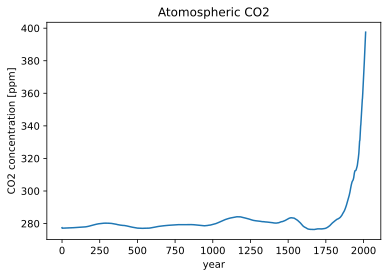

In [38]:
fig, ax = plt.subplots()

ax.set_title('Atomospheric CO2')
ax.plot(df_years.index, df_years['data_mean_global'])
ax.set_xlabel('year')
ax.set_ylabel('CO2 concentration [ppm]')

Pandas readily supports `datetime` objects:

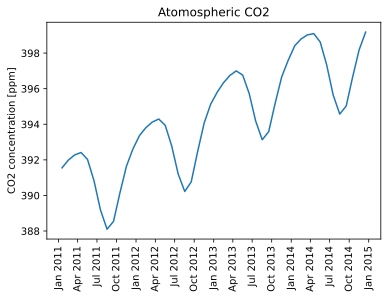

In [39]:
import matplotlib.dates as mdates

df_since_2010 = df[df['year']>2010].copy()
df_since_2010['datetime'] = pd.to_datetime(df_since_2010['datetime'])

fig, ax = plt.subplots()

ax.set_title('Atomospheric CO2')
ax.plot(df_since_2010['datetime'], df_since_2010['data_mean_global'])
ax.set_ylabel('CO2 concentration [ppm]')

ax.xaxis.set_major_locator(mdates.MonthLocator(interval=3))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
ax.xaxis.set_tick_params(rotation=90)

**Exercise 1:** Plot **yearly average** CO2 concentration **between 1700 and 2010**.

**Exercise 2:** Plot the dynamics of the CO2 concentration in January, March and August starting from year 2010, all in the same graph.